# **Flash/No Flash Photography**

### Necessary Libraries

In [ ]:
!pip install imagecodecs

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from scipy import interpolate

### Functions

In [ ]:
def gradient(I):
    gx = np.diff(I, axis=1, prepend=0)
    gy = np.diff(I, axis=0, prepend=0)
    return np.dstack((gx, gy))

def divergence(delta):
    Gx, Gy = delta[...,0], delta[...,1]
    dx = np.pad(Gx[:,1:] - Gx[:,:-1], ((0,0),(0,1)), mode='edge')
    dy = np.pad(Gy[1:,:] - Gy[:-1,:], ((0,1),(0,0)), mode='edge')
    div = dx + dy
    return div

def laplacian(I):
    kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
    lap = signal.convolve2d(I, kernel, mode='same', boundary='symm')
    return lap

## 1. Bilateral Filtering

During the initial stage, my objective was to remove the noise present in the ambient image by employing bilateral filtering methods. To accomplish this, I utilized both flash and non-flash images. The bilateral filtering technique utilizes dual filtering weights that take into account both the distance between pixels and their similarity. This approach provides edge-preserving blur, which helps to reduce noise without excessive blurring. As a result, the final output was a clear and polished image, significantly enhancing its overall quality by eliminating unwanted noise.

**Notation:**
* $F$: Flash image
* $A$: Ambient image
* $g_d$: Gaussian with std $σ_d$, setting the weight in the spatial domain based on
the distance between the pixels.
* $g_r$: Gaussian with std $σ_r$, setting the weight on the range based on intensity differences. (the edge-stopping function)

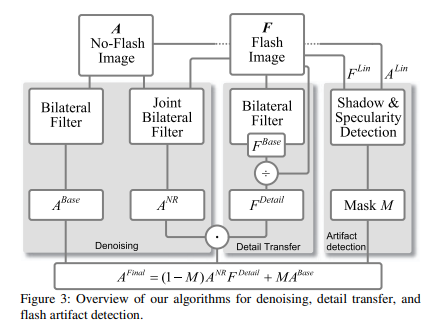

Figure taken from [1]

### 1.1. Bilateral filtering

In [ ]:
def PiecewiseBilateral(I, sigma_r, sigma_s):
    lambda_val = 0.01
    eps = 1e-32
    I_min = np.min(I) - lambda_val
    I_max = np.max(I) + lambda_val

    # Calculate the # of segments
    nb_segments = int(np.ceil((I_max - I_min) / sigma_r))

    # Initialize the output image
    J_img = np.zeros((I.shape[0], I.shape[1], nb_segments))

    for j in range(nb_segments):
        # Calculate the curr intensity
        i_j = I_min + j * (I_max - I_min) / nb_segments
        # Bilateral filtering
        G_j = np.exp(- (I - i_j) ** 2 / (2 * sigma_r ** 2))
        # Convolve G_j with 2D Gaussian kernel
        K_j = cv2.GaussianBlur(G_j, (0, 0), sigma_s)
        H_j = G_j * I
        # Convolve H_j with 2D Gaussian kernel
        H_j_star = cv2.GaussianBlur(H_j, (0, 0), sigma_s)
        J_j = H_j_star / (K_j + eps)
        J_img[..., j] = J_j

    fx, fy = np.meshgrid(np.arange(I.shape[1]), np.arange(I.shape[0]))
    interpGrid = [np.arange(x) for x in J_img.shape]
    interpPoints = np.stack((fy.flatten(), fx.flatten()), axis=-1)
    interpPoints = np.concatenate((interpPoints, np.zeros((interpPoints.shape[0], 1))), axis=-1)
    interpValues = interpolate.interpn(interpGrid, J_img, interpPoints)

    return interpValues.reshape(I.shape)

In [ ]:
A = io.imread('data/lamp/lamp_ambient.tif') / 255   # ambient image
F = io.imread('data/lamp/lamp_flash.tif') / 255     # flash image

<b> Piecewise bilateral filter with different darameters </b>

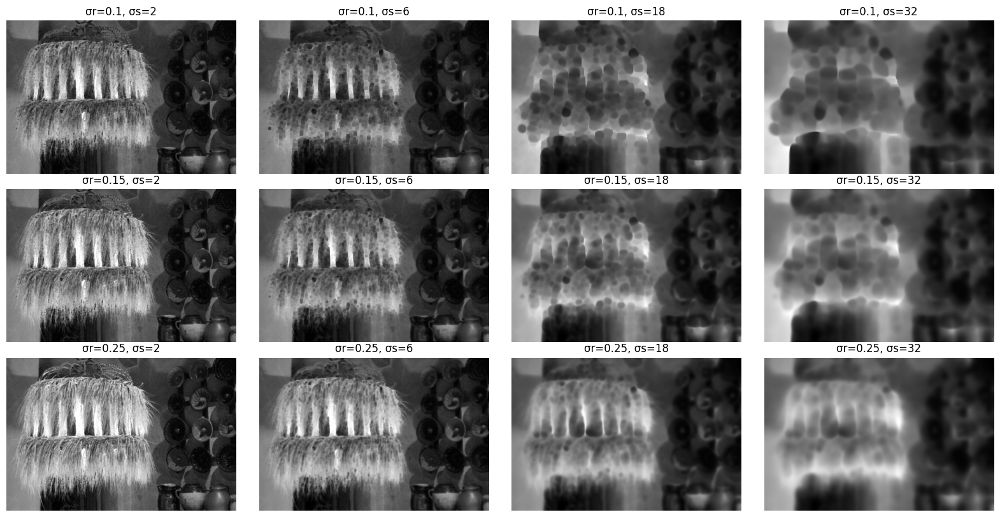

In [ ]:
image = A[...,0]    # use only the red channel
sigma_r_list = [0.1, 0.15, 0.25] 
sigma_s_list = [2, 6, 18, 32]

fig, axes = plt.subplots(len(sigma_r_list), len(sigma_s_list), figsize=(20, 10))

for i in range(len(sigma_r_list)):
    for j in range(len(sigma_s_list)):
        blur = PiecewiseBilateral(image, sigma_r_list[i], sigma_s_list[j])
        axes[i, j].imshow(blur, cmap='gray')
        axes[i, j].set_title(f'σr={sigma_r_list[i]}, σs={sigma_s_list[j]}')
        axes[i, j].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

<b> Difference of filtered and unfiltered images with different parameters </b>

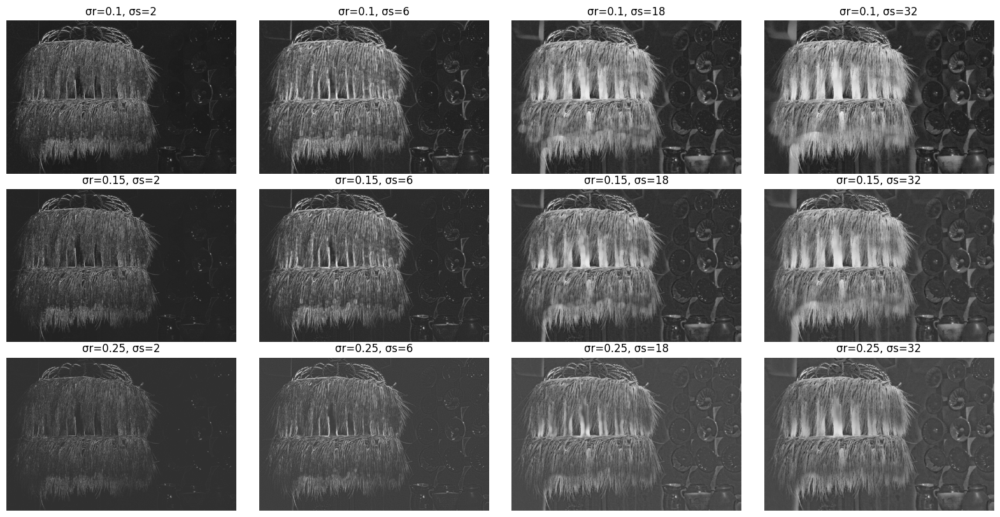

In [ ]:
image = A[...,0]    # use only the red channel
sigma_r_list =  [0.1, 0.15, 0.25]
sigma_s_list = [2, 6, 18, 32]

fig, axes = plt.subplots(len(sigma_r_list), len(sigma_s_list), figsize=(20, 10))

for i in range(len(sigma_r_list)):
    for j in range(len(sigma_s_list)):
        blur = PiecewiseBilateral(image, sigma_r_list[i], sigma_s_list[j])
        axes[i, j].imshow(image - blur, cmap='gray')
        axes[i, j].set_title(f'σr={sigma_r_list[i]}, σs={sigma_s_list[j]}')
        axes[i, j].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

During the work with the bilateral filter, I observed that increasing the interval parameter σr led to the filter becoming more blurred and approaching a Gaussian blur. On the other hand, increasing the spatial parameter σs resulted in a larger area being affected by blurring. To determine the optimal parameter values for the bilateral filtering process, I compared the differences between the original and filtered images. I found that a value of σr=0.25 and σs=2 produced the best results for the continuation of the study. These parameters effectively reduced noise in the ambient image while preserving the sharpness and details of the original image, resulting in a high-quality output.

### 1.2. Joint-bilateral filtering

Joint bilateral filtering, as described in Section 4.1 of Petschnigg et al. [1].

$A_p^{KP} = \frac{1}{k(p)}\sum_{p'\in ω} g_d(p'-p)g_r(F_p-F_{p'})A_{p'}$

<b> Blur images with different parameters </b>

In [ ]:
def JointBilateral(A, F, sigma_r, sigma_s):
    # Define a spatial Gaussian kernel
    w = sigma_s
    x, y = np.meshgrid(np.arange(-w, w + 1), np.arange(-w, w + 1))
    kernel_spatial = np.exp(-(x**2 + y**2) / (2 * sigma_s**2))

    # Padding
    padded_no_flash = np.pad(A, w, mode='symmetric')
    padded_flash = np.pad(F, w, mode='symmetric')

    filtered = np.zeros_like(A)
    for i in range(w, A.shape[0] + w):
        for j in range(w, A.shape[1] + w):
            # Define the range kernel
            kernel_range = np.exp(-((padded_flash[i-w:i+w+1, j-w:j+w+1] - padded_flash[i, j])**2) / (2 * sigma_r**2))
            # Apply the joint bilateral filter
            numerator = np.sum(kernel_spatial * kernel_range * padded_no_flash[i-w:i+w+1, j-w:j+w+1])
            denominator = np.sum(kernel_spatial * kernel_range)
            filtered[i-w, j-w] = numerator / denominator

    return filtered

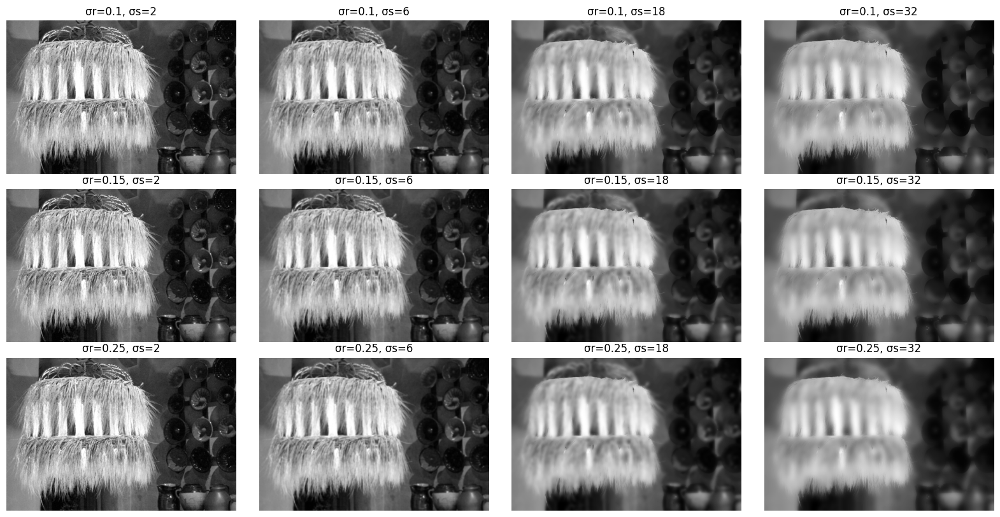

In [ ]:
sigma_r_list =  [0.1, 0.15, 0.25]
sigma_s_list = [2, 6, 18, 32]

fig, axes = plt.subplots(len(sigma_r_list), len(sigma_s_list), figsize=(20, 10))

for i in range(len(sigma_r_list)):
    for j in range(len(sigma_s_list)):
        blur_img_r = JointBilateral(A[...,0], F[...,0], sigma_r_list[i], sigma_s_list[j])

        axes[i, j].imshow(blur_img_r, cmap='gray')
        axes[i, j].set_title(f'σr={sigma_r_list[i]}, σs={sigma_s_list[j]}')
        axes[i, j].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

In this step of the work, I applied a joint bilateral filtering technique and adjusted the relevant parameters accordingly. Specifically, I selected a value of σr=0.25 to match the bilateral filter used earlier. This helped to ensure consistency and maintain the desired level of blurring. Additionally, to prevent overblurring, I selected a value of σs=2, which allowed for a more targeted approach to noise reduction without compromising the clarity and sharpness of the original image.

### 1.3. Detail transfer

Enhance the details using flash-to-ambient detail transfer procedure as described in Sec. 4.2 of Petschnigg et al. [1]. 

$A^{Detail} = A^{NR}\frac{F + ϵ}{F^{Base} + ϵ}$

**Notation:**
* $A^{NR}$: Produced image in joint-bilateral filtering
* $F$: the flash image
* $F^{Base}$: Img computed by appling Bilateral filtering


In [ ]:
def detail_transfer(A_NR, F, F_base):
    eps = 0.0001
    return A_NR * (F + eps) / (F_base + eps)

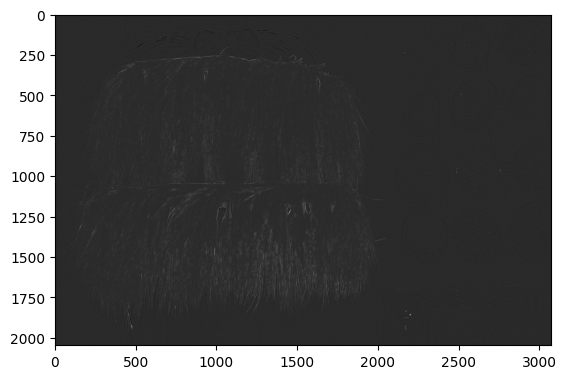

In [ ]:
A_NR = JointBilateral(A[...,0], F[...,0], sigma_r=0.25, sigma_s=2)
F_base = PiecewiseBilateral(F[..., 0], sigma_r=0.25, sigma_s=2)
A_detail = detail_transfer(A_NR, F[..., 0], F_base)
plt.imshow(A_detail - A[..., 0], cmap='gray')

### 1.4. Implement shadow and specularity masking

The mask $M$ described in Section 4.3 of Petschnigg et al. [1]. This is used to detect regions in the flash image that have shadows or  specularities not present in the ambient image. The mask can be generated using the simple thresholding operations described in the paper.

* Mask matrix for shadow, $M^{shadow}$, is calculated as follows:

    * $M^{shadow}[i][j] = 1$ if $F-A \leq t_{shadow}$

    * $M[i][j] = 0$ otherwise, where $t_{shadow}$ is the threshold.

* For the mask matrix for specularities, $M^{spec}$, detect pixels with luminance greater than 95% of the sensor output values. 


In [ ]:
def shadow_mask(F, A, t_shadow):
    return np.where((F - A) <= t_shadow, 1, 0)

def create_mask(F, A, t_shadow):
    M_shadow = (F - A <= t_shadow).astype(np.uint8)

    hsv = cv2.cvtColor(F.astype(np.float32), cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    M_specular = (v >= 0.95 * np.max(v)).astype(np.uint8)
    M_specular = M_specular[:, :, np.newaxis]

    return M_shadow * M_specular

In [ ]:
def inverse_gamma(img):
    img_copy = np.copy(img)
    img_copy[img_copy <= 0.0404482] = img_copy[img_copy <= 0.0404482] / 12.92
    img_copy[img_copy > 0.0404482] = ((img_copy[img_copy > 0.0404482] + 0.055) / 1.055) ** 2.4
    return np.clip(img_copy, 0, 1)

**Once you have the mask, form a final estimate $A^{Final}$ of the ambient image as:**

$A^{Final} = (1-M).A^{Detail} + M.A^{Base}$

In [ ]:
def bilateral_filtering_pipeline(F, A, sigma_r, sigma_s, t_shadow):
    F_base = np.zeros_like(F)
    for c in range(F_base.shape[-1]):
        F_base[...,c] = PiecewiseBilateral(F[...,c], sigma_r, sigma_s)

    A_base = np.zeros_like(A)
    for c in range(A_base.shape[-1]):
        A_base[...,c] = PiecewiseBilateral(A[...,c], sigma_r, sigma_s)

    A_NR = np.zeros_like(A)
    for c in range(A_NR.shape[-1]):
        A_NR[...,c] = JointBilateral(A[...,c], F[...,c], sigma_r, sigma_s)


    F_lin = inverse_gamma(F)
    A_lin = inverse_gamma(A)
    M = create_mask(F_lin, A_lin, t_shadow)

    A_detail = detail_transfer(A_NR, F, F_base)

    A_Final = ((1-M) * A_detail) + (M * A_base)
    return np.clip(A_Final,0,1)

<b> Result images with different parameters </b>

In [ ]:
sigma_r_list =  [0.1, 0.15, 0.25]
sigma_s_list = [2, 6, 8]

fig, axes = plt.subplots(len(sigma_r_list), len(sigma_s_list), figsize=(16,12))

for i in range(len(sigma_r_list)):
    for j in range(len(sigma_s_list)):
        final_image = bilateral_filtering_pipeline(F, A, sigma_r_list[i], sigma_s_list[j], t_shadow=0.5)
        final_image = np.clip(final_image,0,1)

        axes[i, j].imshow(final_image)
        axes[i, j].set_title(f'σr={sigma_r_list[i]}, σs={sigma_s_list[j]}')
        axes[i, j].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

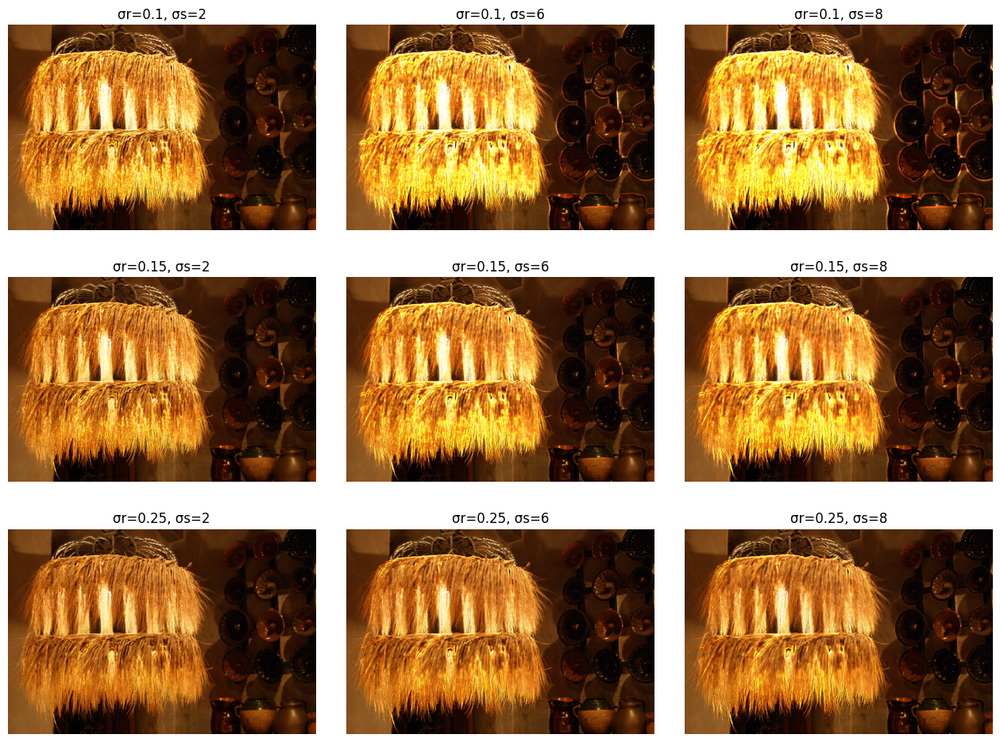

<b> Different $τ_{Shad}$ values </b>

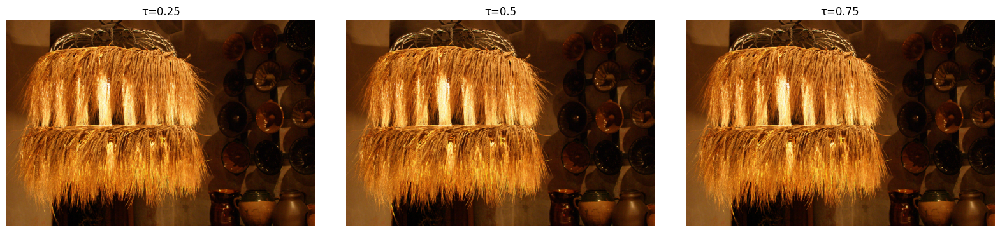

In [ ]:
t_shadow_list =  [0.25, 0.5, 0.75]

fig, axes = plt.subplots(1, len(t_shadow_list), figsize=(20, 15))

for i in range(len(t_shadow_list)):
    final_image = bilateral_filtering_pipeline(F, A, sigma_r=0.25, sigma_s=2, t_shadow=t_shadow_list[i])
    axes[i].imshow(np.clip(final_image,0,1))
    axes[i].set_title(f'τ={t_shadow_list[i]}')
    axes[i].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

<b> Final image</b>

In [ ]:
final_image = bilateral_filtering_pipeline(F, A, 0.25, 2, t_shadow=0.25)

fig, ax = plt.subplots(1,2, figsize=(20,10))
ax[0].imshow(A)
ax[0].set_title('Ambient Image')
ax[0].axis('off')
ax[1].imshow(final_image)
ax[1].set_title('Denoised Image')
ax[1].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

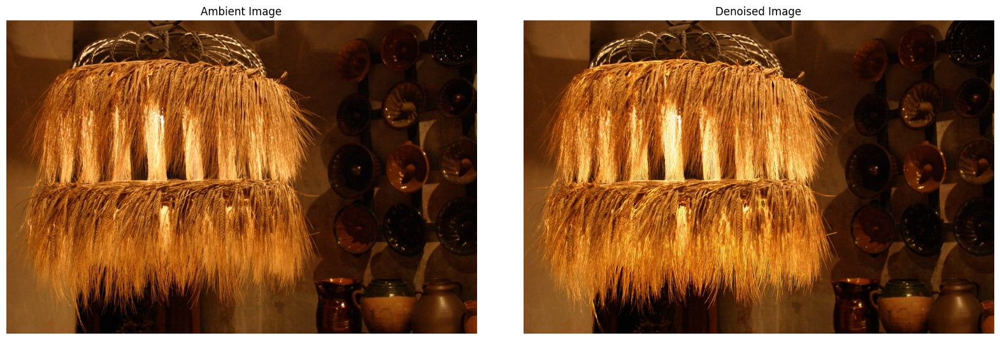

When experimenting with the bilateral filter, I observed that selecting a smaller value for the σr parameter led to color shifts in the image, resulting in some pixels appearing brighter than they should have been. I have found that important details are lost when noise and image content are not properly distinguished.

On the other hand, the value of σs played a critical role in determining the sharpness of the image edges. When σs was set to a larger value, the edges of the image appeared sharper. Conversely, selecting a smaller value for σs resulted in less blurring and a sharper image overall, but with less emphasis on edge sharpness.

This statement suggests that the bilateral filter was successful in removing the noise from the image, but there were still unwanted bright pixels present that the filter was unable to remove. Due to the slow speed of the algorithm, there was limited opportunity to experiment with different parameter values and find a better solution to address this issue.

## 2. Gradient Domain Processing

In this section, my primary focus was to blend flash and ambient images in order to create even lighting that is free from any specular highlights or other imperfections. To achieve this, I utilized the gradient-domain processing method, which was proposed by Agrawal et al. [3]. This technique enabled me to seamlessly merge the two types of images and remove any unwanted shadows, overexposure, or underexposure. The end result was a cohesive and polished image that met the requirements of the assignment.


In [ ]:
A = (io.imread('data/museum/museum_ambient.png') / 255).astype(np.float32)      # ambient image
F = (io.imread('data/museum/museum_flash.png') / 255).astype(np.float32)        # flash image

### 2.1. Differentiate and then re-integrate an image


During this stage of the process, I performed calculations of divergence utilizing a Poisson solver. This step helped to ensure that the fusion of the flash and ambient images was seamless and that the final output achieved the desired uniform lighting without any specularity or other defects.

In [ ]:
def initialize_input(I, del_target):
    I_init_star = np.zeros_like(I)
    D = divergence(del_target)
    B = np.zeros_like(I)
    B[1:-1, 1:-1] = 1
    I_boundary = np.copy(I)
    I_boundary[1:-1, 1:-1] = 0

    return I_init_star, D, B, I_boundary

In [ ]:
def CGD(I_init_star, D, B, I_boundary, eps=1e-6, N=1000):
    # Initialization
    I_star = B * I_init_star + (1 - B) * I_boundary
    r = B * (D - laplacian(I_star))
    d = r
    delta_new = np.dot(r.flatten(), r.flatten())
    n = 0

    # Gradient descent
    while np.sqrt(np.dot(r.flatten(), r.flatten())) > eps and n < N:
        q = laplacian(d)
        eta = delta_new / np.dot(d.flatten(), q.flatten())
        I_star += B * (eta * d)
        r = B * (r - (eta * q))
        delta_old = delta_new
        delta_new = np.dot(r.flatten(), r.flatten())
        beta = delta_new / delta_old
        d = r + (beta * d)
        n += 1

    return I_star

<b> Different eps and N value </b>

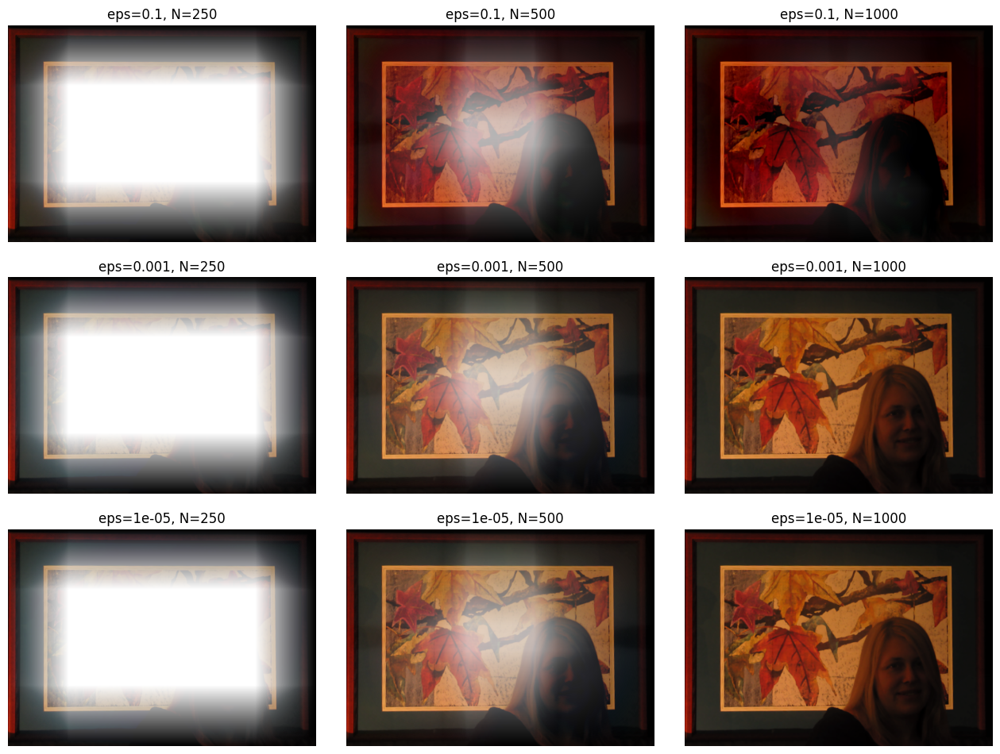

In [ ]:
eps_list = [0.1, 0.001, 0.00001]
N_list = [250, 500, 1000]

fig, axes = plt.subplots(len(eps_list), len(N_list), figsize=(16, 12))
for i in range(len(eps_list)):
    for j in range(len(N_list)):
        I_star = np.zeros_like(A)
        for c in range(I_star.shape[-1]):
            # Initialization
            I = A[..., c]
            del_target = gradient(I)
            I_init_star, D, B, I_boundary = initialize_input(I, del_target)
            # GCD
            I_star[..., c] =  CGD(I_init_star, D, B, I_boundary, eps=eps_list[i], N=N_list[j])

        axes[i, j].imshow(np.clip(I_star, 0, 1))
        axes[i, j].set_title(f'eps={eps_list[i]}, N={N_list[j]}')
        axes[i, j].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

During my experimentation with the Poisson solver using various parameters, I closely examined the impact of the ϵ and N values on the convergence of the algorithm. What I observed was that decreasing the value of ϵ and increasing the value of N had a positive impact on the algorithm's convergence rate. In simpler terms, as I decreased the value of ϵ and increased the value of N, the algorithm converged more quickly and produced more precise results. Also, I noticed that when using large values for epsilon, chromatic aberration occurred. On the other hand, when using small values for N, the image remained incomplete. These observations allowed me to optimize the performance of the Poisson solver and achieve the desired outcomes for the assignment. In the next steps of my work, I took the ϵ value as 1e-05 and the N value as 1000.

### 2.1. Create the fused gradient field

**Notation:**

* ${a}:$ Ambient image
* $\nabla{\Phi}':$ Flash image
* $\nabla{\Phi}$*: Fused image

#### 2.1.1. $\nabla {a}$ and $\nabla{\Phi}'$

In [ ]:
def compute_gradient(alpha, phi):
    del_a = gradient(alpha)
    del_phi = gradient(phi)

    return del_a, del_phi

#### 2.1.2. Gradient orientation coherency map M using:

$ M = \frac{|\nabla{\Phi}' \nabla{a}|}{||\nabla{\Phi}'|| ||\nabla{a}'||}$

In [ ]:
def calculate_M(del_a, del_phi):
    a_x, a_y = del_a[...,0], del_a[...,1]
    phi_x, phi_y = del_phi[...,0], del_phi[...,1]

    numerator = np.abs(phi_x * a_x + phi_y * a_y)
    denominator = np.sqrt(phi_x ** 2 + phi_y ** 2) * np.sqrt(a_x ** 2 + a_y ** 2)
    M = numerator / (denominator + 1e-9)
    return M

#### 2.1.3. The pixel-wise saturation weight map $w_s$

$w_s = tanh(\sigma . (\Phi'-\tau_s))$

In [ ]:
def saturation_weight_map(phi, t_s, sigma):
    ws = np.tanh(sigma * (phi - t_s))
    return ws

def normalize_map(ws):
    return 0.5 * (ws + 1)

#### 2.1.4. A new gradient field for the fused image $\Phi$*

$\nabla{\Phi}$* = $w_s . \nabla{a} + (1-w_s)$  $(M.\nabla{\Phi}$' + (1-M) $\nabla{a}$ )

In [ ]:
def fuse_image(del_a, del_phi, M, ws):
    a_x, a_y = del_a[...,0], del_a[...,1]
    phi_x, phi_y = del_phi[...,0], del_phi[...,1]

    del_phi_star = np.zeros_like(del_a)
    del_phi_star[:,:,0] = ws * a_x + (1 - ws) * (M * phi_x + (1-M) * a_x)
    del_phi_star[:,:,1] = ws * a_y + (1 - ws) * (M * phi_y + (1-M) * a_y)

    return del_phi_star

In [ ]:
def compute_gradient_field(alpha, phi, t_s, sigma):
    del_a = gradient(alpha)
    del_phi = gradient(phi)

    M = calculate_M(del_a, del_phi)
    ws = saturation_weight_map(phi, t_s, sigma)
    norm_ws = normalize_map(ws)
    del_phi_star = fuse_image(del_a, del_phi, M, norm_ws)

    return del_phi_star

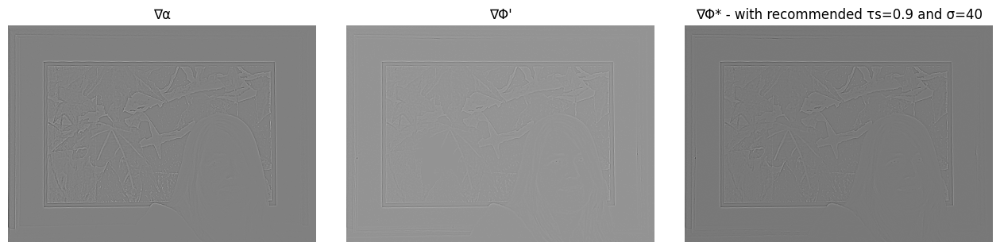

In [ ]:
# ∇α,  ∇Φ', ∇Φ*
alpha = A[...,0]
phi = F[..., 0]
del_a, del_phi = compute_gradient(alpha, phi)

fig, axs = plt.subplots(1, 3, figsize=(16, 4))

axs[0].set_title('∇α')
axs[0].axis('off')
axs[0].imshow(divergence(del_a), cmap='gray')

axs[1].set_title("∇Φ'")
axs[1].axis('off')
axs[1].imshow(divergence(del_phi), cmap='gray')

axs[2].set_title("∇Φ* - with recommended τs=0.9 and σ=40")
axs[2].axis('off')
del_phi_star = compute_gradient_field(alpha, phi, t_s=0.9, sigma=40)
axs[2].imshow(divergence(del_phi_star), cmap='gray')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

#### 2.1.4. Integrate the gradient field $\nabla{\Phi}$*, by computing its divergence.

<b> Fused image with different τs and σ values </b>

In [ ]:
tao_list = [0.5, 0.9, 1]
sigma_list = [10, 40, 160]

fig, axes = plt.subplots(len(tao_list), len(sigma_list), figsize=(16, 12))
for i in range(len(tao_list)):
    for j in range(len(sigma_list)):
        fused_image = np.zeros_like(A)
        for c in range(A.shape[-1]):
            alpha = A[..., c]
            phi = F[..., c]
            del_phi_star = compute_gradient_field(alpha, phi, t_s=tao_list[i], sigma=sigma_list[j]) # Recommended t and sigma values.
            I_init_star, D, B, I_boundary = initialize_input(alpha, del_phi_star)
            fused_image[..., c] = CGD(I_init_star, D, B, I_boundary, eps=1e-05, N=1000)

        io.imsave(f'output/gradient/gradient_{tao_list[i]}_{sigma_list[j]}.png', fused_image)
        axes[i,j].imshow(fused_image)
        axes[i, j].set_title(f'τs={tao_list[i]}, σ={sigma_list[j]}')
        axes[i, j].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

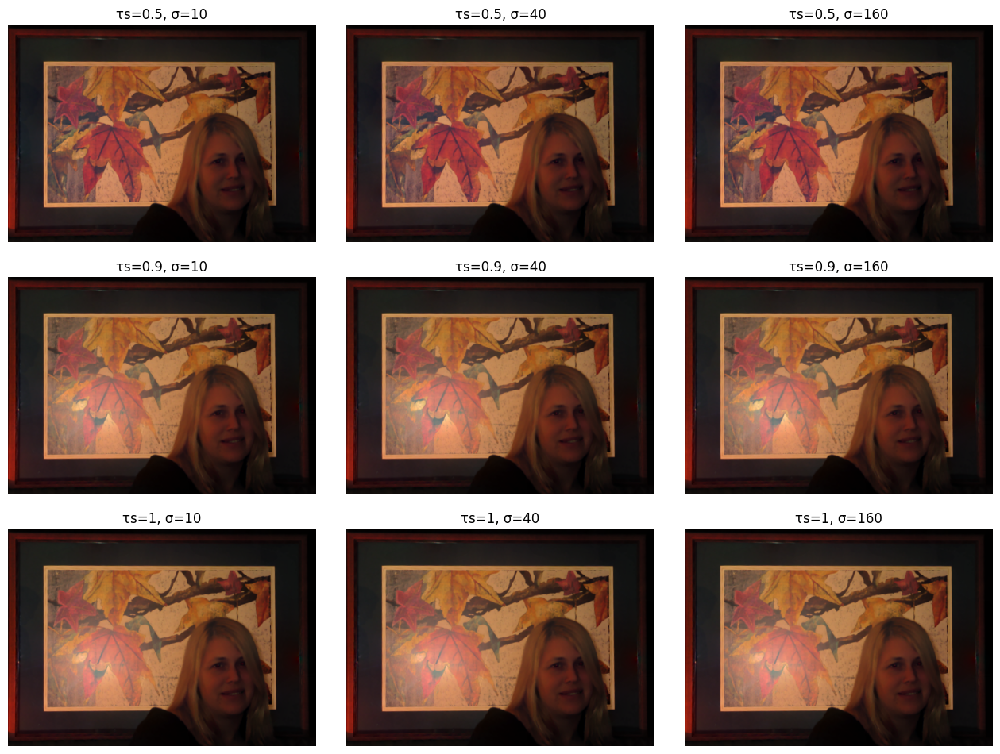

In [ ]:
fused_image1 = np.zeros_like(A)
fused_image2 = np.zeros_like(A)
for c in range(A.shape[-1]):
    alpha = A[..., c]
    phi = F[..., c]
    del_phi_star = compute_gradient_field(alpha, phi, t_s=0.5, sigma=40)

    I_init_star, D, B, I_boundary = initialize_input(alpha, del_phi_star)
    fused_image1[..., c] = CGD(I_init_star, D, B, I_boundary, eps=0.001, N=1000)

    I_init_star, D, B, I_boundary = initialize_input(phi, del_phi_star)
    fused_image2[..., c] = CGD(I_init_star, D, B, I_boundary, eps=0.001, N=1000)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(fused_image1)
axes[0].set_title('Boundry with alpha')
axes[0].axis('off')

axes[1].imshow(fused_image2)
axes[1].set_title('Boundry with phi')
axes[1].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

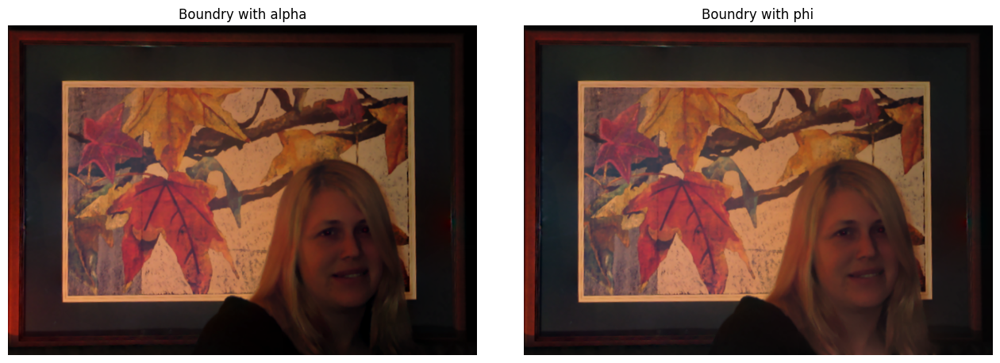

In the fused images, the parameter τs controls the relative strength of the flash component in the final image. As τs increases, the flash-lit areas of the image become brighter, but this can also lead to a loss of detail and increased blurring in these areas.

During experimentation, I observed that setting the value of tao_s to 0.4 preserved more of the details in the background image compared to the values suggested in the article. Also, I found that using the flash image as the initial condition for Dirichlet boundary conditions resulted in a brighter final image, which I believe produced better results overall.

## 3. Custom flash/no-flash pairs

In [ ]:
A = (io.imread('data/custom/ambient.jpg') / 255).astype(np.float32)
F = (io.imread('data/custom/flash.jpg') / 255).astype(np.float32)
final_image = bilateral_filtering_pipeline(F, A, 0.25, 2, t_shadow=0.25)

The first pair of images suffered from technical glitches that caused a misalignment between the flash and ambient images. This resulted in phantom borders appearing along the edges of the images where the alignment was off, creating an unwanted visual artifact.

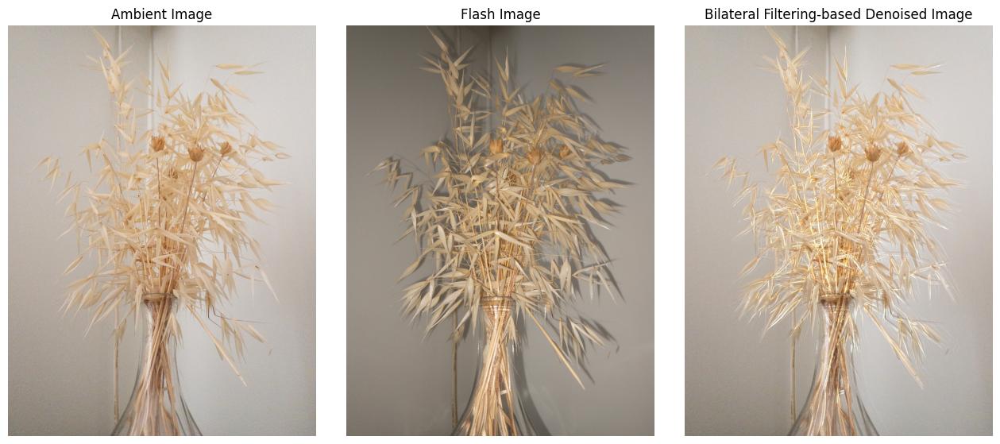

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(16, 8))
axes[0].imshow(A)
axes[0].set_title('Ambient Image')
axes[0].axis('off')

axes[1].imshow(F)
axes[1].set_title('Flash Image')
axes[1].axis('off')

axes[2].imshow(final_image)
axes[2].set_title('Bilateral Filtering-based Denoised Image')
axes[2].axis('off')

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

## 4. REFERENCES

[1] G. Petschnigg, R. Szeliski, M. Agrawala, M. Cohen, H. Hoppe, and K. Toyama. Digital photography with flash and no-flash image pairs. ACM Transactions on Graphics (TOG), 23(3):664–672,
2004.
Page 7

[2] F. Durand and J. Dorsey. Fast bilateral filtering for the display of high-dynamic-range images.
In Proceedings of the 29th Annual Conference on Computer Graphics and Interactive Techniques,
SIGGRAPH ’02, pages 257–266, New York, NY, USA, 2002. ACM.

[3] A. Agrawal, R. Raskar, S. K. Nayar, and Y. Li. Removing photography artifacts using gradient
projection and flash-exposure sampling. ACM Transactions on Graphics (TOG), 24(3):828–835,
2005.

[4] J. R. Shewchuk. An introduction to the conjugate gradient method without the agonizing pain.
School of Computer Science. Carnegie Mellon University, Pittsburgh, PA, 15213:10, 1994.

[5] International Electrotechnical Commission and others. IEC 61966-2-1:1999. Multimedia sys-
tems and equipment–Colour measurements and management–Part 2-1: Colour management–Default
RGB colour space–sRGB, 1999.
Page 8

